## Complete algorithm

This will be the collection of all the code used during the analysis and development of the retention time algorithm. This notebook will be devided in five chapters:

Chapter 1 - EDA

Chapter 2 - Pumping operation times

Chapter 3 - ART calculation

Chapter 4 - Plotting results

Chapter 5 - Probability and statistical analysis


## Result Summery

**Fit between ART_flow & ART_temp:**

**Departure ART:**
- Mean Root Squared Error = 2.88% (with outliers removed)
- R² = 0.88
- t-Test: No significant difference found (p-value = 0.51)

**Arrival ART:**
- Mean Root Squared Error = 2.63% (with outliers removed)
- R² = 0.91
- t-Test: No significant difference found (p-value = 0.77)

**Probability Analysis:**
- **98.0%** probability of temperature change occuring within 3 minutes of a pumping event 
- **1.0%** probability of temperature change occuring when no pumping event occured


In [1]:
# Import libraries
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set()

from datetime import datetime
from datetime import timedelta

from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import cufflinks as cf
init_notebook_mode(connected=True)
cf.go_offline()
import plotly.express as px

from sklearn.linear_model import LinearRegression

In [2]:
data = pd.read_json('Data/pilot_plant_RTD.json')

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 97391 entries, 2019-10-10 00:00:00 to 2019-12-16 15:10:00
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   P201    97391 non-null  float64
 1   H2S_aq  97391 non-null  float64
 2   L2PB    97391 non-null  float64
 3   Temp    97391 non-null  float64
dtypes: float64(4)
memory usage: 3.7 MB


In [4]:
# Import data set
data = pd.read_json('pilot_plant_RTD.json')

# Choose sample from 15.11.2019 to 11.12.2019
data = data.loc['2019-11-14':'2019-12-11']

# Set pandas Datetime index frequency to minutes
data.index.freq = 'T'

#rename columns and drop L2PB column
data[['Q','T_ww']] = data[['P201','Temp']]
data.drop(['P201','L2PB','Temp'], axis = 1, inplace= True)

data.head()

,H2S_aq,Q,T_ww
2019-11-14 00:00:00,3.760,0.0146,14.5
2019-11-14 00:01:00,3.773,0.0146,14.5
2019-11-14 00:02:00,3.774,0.0146,14.4
2019-11-14 00:03:00,3.788,0.0146,14.4
2019-11-14 00:04:00,3.806,0.0145,14.4


# Chapter 1 - EDA

In [5]:
# Plot Time Series

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
#fig.add_trace(
    #go.Scatter(x=data.index, y=data['Q'], name="Flow Rate [m³/h]"),
    #secondary_y=False,
#)

fig.add_trace(
    go.Scatter(x=data.index, y=data['T_ww'], name="Temperature [°C]", 
               line = dict(width= 0.9)), secondary_y=True,           
)

fig.add_trace(
    go.Scatter(x=data.index, y=data['H2S_aq'], name="H2S [mg/L]", 
               line = dict(width= 0.9)), secondary_y=False,           
)

# Add figure title
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.75
))


# Set x-axis title
fig.update_xaxes(title_text="Date")
fig.update_yaxes(title_text="Temperature [°C]",secondary_y=True )
fig.update_yaxes(title_text="H2S [mg/L]",secondary_y=False)

#tick size
fig.update_yaxes(tickfont=dict(size=15))
fig.update_xaxes(tickfont=dict(size=15))

#number of ticks
fig.update_xaxes(nticks=20,tickangle = 45)
fig.update_yaxes(nticks=9, tickangle = 0)

#x - y title font size
fig.update_xaxes(title_font=dict(size=18))
fig.update_yaxes(title_font=dict(size=18))

fig.update_yaxes(automargin=True)
fig.update_xaxes(automargin=True)
fig.show()

In [6]:
data.describe()

,H2S_aq,Q,T_ww
count,40320.000000,40320.000000,40320.000000
mean,2.021580,0.327623,13.879821
std,3.224715,1.109056,1.796599
min,0.000000,0.014200,8.200000
25%,0.059000,0.014500,12.800000
50%,0.434000,0.014600,13.900000
75%,2.832000,0.014800,15.200000
max,22.005000,6.897300,19.100000


## H2S data

In [7]:
fig = px.histogram(data, x="H2S_aq",
                   nbins = 90,
                   title='Histogram of H2S',
                   labels={'H2S_aq':'H2S [mg/L]'},
                  histnorm='probability density',
                  )


fig.update_yaxes(tickfont=dict(size=15), title = 'probability')
fig.update_xaxes(tickfont=dict(size=15))

fig.update_xaxes(nticks=15)

fig.update_xaxes(title_font=dict(size=18))
fig.update_yaxes(title_font=dict(size=18))


fig.show()



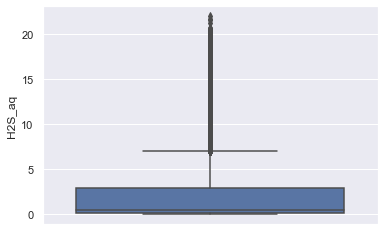

In [8]:
# H2S data
fig, ax = plt.subplots()
sns.boxplot(y = data['H2S_aq'], ax=ax)
plt.show();

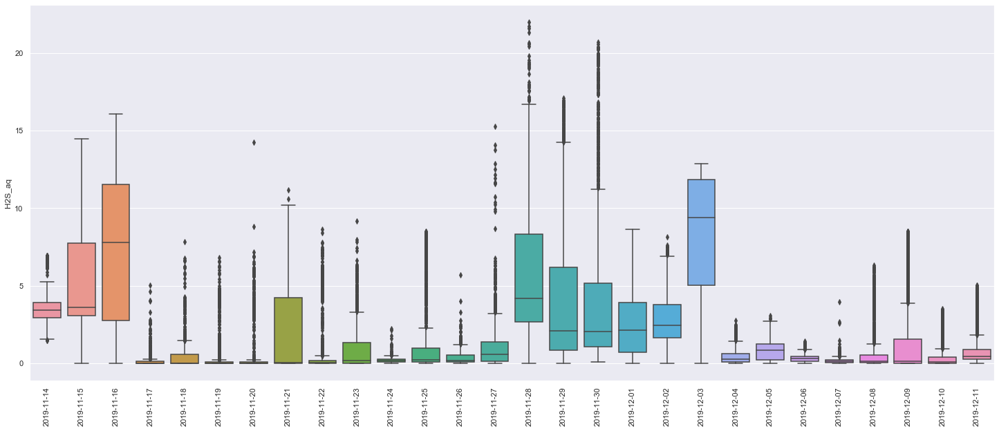

In [9]:
# H2S data per day
fig, ax = plt.subplots(figsize=(25,10))
sns.boxplot(data['H2S_aq'].index.date, data['H2S_aq'], ax=ax)
plt.xticks(rotation=90)
plt.show()

In [10]:
# Example of H2S time series 

fig = px.line(data.loc['2019-11-26']['H2S_aq'], y="H2S_aq",
                   title='',
                   labels={'H2S_aq':'H2S [mg/L]','index':''}
                  )

fig.update_yaxes(tickfont=dict(size=15))
fig.update_xaxes(tickfont=dict(size=15))

fig.update_xaxes(nticks=23,tickangle = 0)
fig.update_yaxes(nticks=9, tickangle = 0)

#x - y title font size
fig.update_xaxes(title_font=dict(size=18))
fig.update_yaxes(title_font=dict(size=18))

fig.show()

#data.loc['2019-11-26']['H2S_aq'].iplot(yTitle = 'H2S [mg/L]')


## Temperature Data

In [11]:
# Temperature data distribution


fig = px.histogram(data, x="T_ww",
                   nbins = 90,
                   title='Histogram of Temperature',
                   labels={'T_ww':'Temperature [°C]'},
                  histnorm='probability density')

fig.update_yaxes(tickfont=dict(size=15), title = 'probability')
fig.update_xaxes(tickfont=dict(size=15))

fig.update_xaxes(nticks=15)


fig.show()

#data['T_ww'].iplot(kind = 'hist', bins = 90
                       #, title = 'Distribution of Temperature',
                     #colors = 'red',
                     #xTitle = 'Temperature [°C]',
                     #yTitle = 'Probability density',
                  #histnorm = 'probability density')

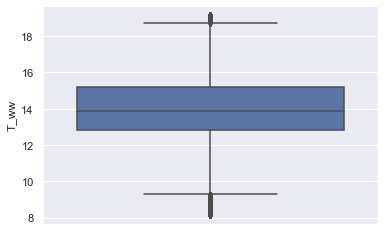

In [12]:
# temperature data
fig, ax = plt.subplots()
sns.boxplot(y = data['T_ww'], ax=ax)
plt.show()

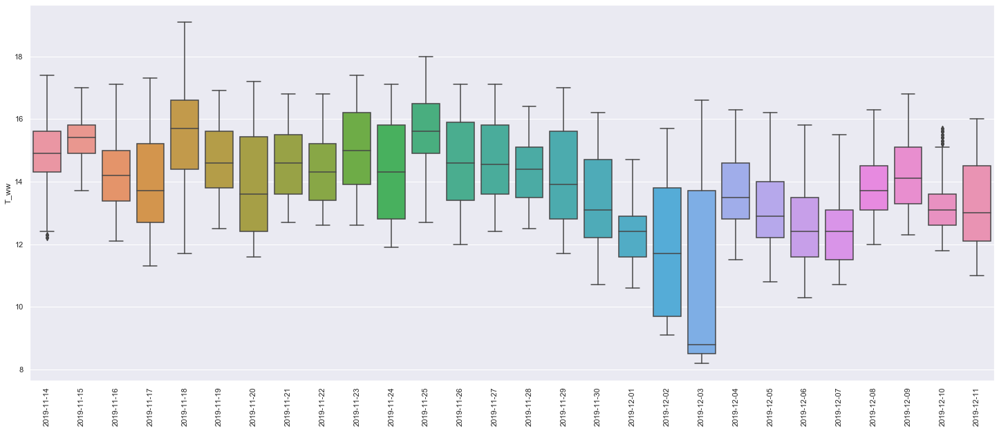

In [13]:
# temperature data per day
fig, ax = plt.subplots(figsize=(25,10))
sns.boxplot(data['T_ww'].index.date, data['T_ww'], ax=ax)
plt.xticks(rotation=90)
plt.show()

In [14]:
# Example of Temperature time series 

fig = px.line(data.loc['2019-11-26']['T_ww'], y="T_ww",
                   title='',
                   labels={'T_ww':'Temperature [°C]','index':''}
                  )

fig.update_yaxes(tickfont=dict(size=15))
fig.update_xaxes(tickfont=dict(size=15))

fig.update_xaxes(nticks=23,tickangle = 0)
fig.update_yaxes(nticks=9, tickangle = 0)


fig.show()

#data.loc['2019-11-26']['T_ww'].iplot(yTitle = 'Temperature [°C]')

## Flow Rate Data

In [15]:
# Flow Rate data distribution

fig = px.histogram(data, x="Q",
                   nbins = 90,
                   title='Histogram of Flow rate',
                   labels={'Q':'Flow Rate [m³/h]'},
                  histnorm='probability density')

fig.update_yaxes(tickfont=dict(size=15), title = 'probability')
fig.update_xaxes(tickfont=dict(size=15))

fig.update_xaxes(nticks=15)


fig.show()



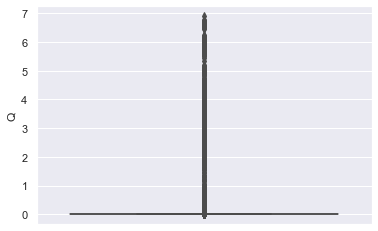

In [16]:
# Flow ratedata
fig, ax = plt.subplots()
sns.boxplot(y = data['Q'], ax=ax)
plt.show()

# Flow rate data per day
fig, ax = plt.subplots(figsize=(25,10))
sns.boxplot(data['Q'].index.date, data['Q'], ax=ax)
plt.xticks(rotation=90)
plt.show()

In [17]:
# Example of Flow Rate time series 
fig = px.line(data.loc['2019-11-26']['Q'], y="Q",
                   title='',
                   labels={'Q':'Flow Rate [m³/h','index':''}
                  )
fig.update_yaxes(tickfont=dict(size=15))
fig.update_xaxes(tickfont=dict(size=15))

fig.update_xaxes(nticks=23,tickangle = 45)
fig.update_yaxes(nticks=9, tickangle = 0)

fig.show()


#data.loc['2019-11-26']['Q'].iplot(yTitle = 'Flow Rate [m³/h]')


## Temperature and Flow Rate

In [18]:
# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])


# Add traces
fig.add_trace(
    go.Scatter(x=data.loc['2019-11-26'].index, 
               y=data.loc['2019-11-26']['Q'], 
               name="Flow Rate [m³/h]"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=data.loc['2019-11-26'].index,
               y=data.loc['2019-11-26']['T_ww'],
               name="Temperature [°C]", 
               line = dict(width= 0.9)), secondary_y=True,           
)

# Add figure title
# Add figure title
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.75
))

# Set x-axis title
fig.update_xaxes(title_text="Date")
#fig.update_yaxes(title_text="Temperature [°C]",secondary_y=True)
fig.update_yaxes(title_text="Flow Rate [m³/h]",secondary_y=False)

fig.update_yaxes(tickfont=dict(size=15))
fig.update_xaxes(tickfont=dict(size=15))

fig.update_xaxes(nticks=10,tickangle = 45)
fig.update_yaxes(nticks=9, tickangle = 0)

fig.update_yaxes(automargin=True)
fig.update_xaxes(automargin=True)
fig.show()

## Temperature and H2S

In [19]:
# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])


# Add traces
fig.add_trace(
    go.Scatter(x=data.loc['2019-11-26'].index, 
               y=data.loc['2019-11-26']['H2S_aq'], 
               name="H2S [mg/L]"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=data.loc['2019-11-26'].index,
               y=data.loc['2019-11-26']['T_ww'],
               name="Temperature [°C]", 
               line = dict(width= 0.9)), secondary_y=True,           
)

# Add figure title

fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.75
))

# Set x-axis title
fig.update_xaxes(title_text="Date")
fig.update_yaxes(title_text="Temperature [°C]",secondary_y=True)
fig.update_yaxes(title_text="H2S 8[mg/L]",secondary_y=False)

fig.update_yaxes(tickfont=dict(size=15))
fig.update_xaxes(tickfont=dict(size=15))

fig.update_xaxes(nticks=23,tickangle = 0)
fig.update_yaxes(nticks=9, tickangle = 0)


fig.update_yaxes(automargin=True)
fig.update_xaxes(automargin=True)
fig.show()

# Chapter 2 - Pumping Operation Times

## 2.1 Flow Data

In [20]:
d = data['Q']
df_flow = pd.DataFrame(data = d.values, columns= ['Flow_Rate'], index = d.index)

In [21]:
df_flow[df_flow.index.day == 26]

,Flow_Rate
2019-11-26 00:00:00,0.0146
2019-11-26 00:01:00,2.4416
2019-11-26 00:02:00,4.2828
2019-11-26 00:03:00,4.4717
2019-11-26 00:04:00,4.5089
...,...
2019-11-26 23:55:00,0.0146
2019-11-26 23:56:00,0.0146
2019-11-26 23:57:00,0.0146
2019-11-26 23:58:00,0.0146


**Determine pump on & off times**

To find pumping times we will use the following parameters:

- When flow is >= 3 m³/h --> pump is on
- When flow is <  3 m³/h --> pump is off


In [22]:
# Create new feature called Pump_ON
# Value 1 = pump is on, value 0 = pump is off

df_flow['Pump_ON'] = df_flow['Flow_Rate'].apply(lambda x: 1 if x >= 3 else 0)
df_flow.head()

,Flow_Rate,Pump_ON
2019-11-14 00:00:00,0.0146,0
2019-11-14 00:01:00,0.0146,0
2019-11-14 00:02:00,0.0146,0
2019-11-14 00:03:00,0.0146,0
2019-11-14 00:04:00,0.0145,0


In [23]:
#df_flow.loc['2019-11-26'][800:900].head(60)

* Create function that retrieves start and stop times based on the consecutive values in the column 'Pump_ON' that are equal to 1

In [127]:
# Function returns dataset with timestamps of pump start
# and pump stop

def pumping(data):
    
    pump_duration = []
    pump_start = []
    pump_stop = []
    
    numList = data['Pump_ON'].values
    i = 0

    while i < len(numList) - 1:
        n = numList[i]
        startIndex = i
        if numList[i] == 1:
            while i < len(numList) - 1 and numList[i] == numList[i + 1]:
                i = i + 1

            endIndex = i
            
            pump_start.append(df_flow.iloc[startIndex].name)
            pump_stop.append(df_flow.iloc[endIndex].name)      
            
        i = i + 1
    
    d = {'Pump_Start': pump_start, 'Pump_Stop': pump_stop}
    return pd.DataFrame(data = d )

In [128]:
df_pump_flow = pumping(df_flow)
#Add column called 'Duration' to df_pump_flow
df_pump_flow['Duration'] = (df_pump_flow['Pump_Stop'] - df_pump_flow['Pump_Start'])
df_pump_flow.head()

,Pump_Start,Pump_Stop,Duration
0,2019-11-14 01:02:00,2019-11-14 01:07:00,00:05:00
1,2019-11-14 02:02:00,2019-11-14 02:07:00,00:05:00
2,2019-11-14 03:33:00,2019-11-14 03:37:00,00:04:00
3,2019-11-14 04:02:00,2019-11-14 04:04:00,00:02:00
4,2019-11-14 08:02:00,2019-11-14 08:07:00,00:05:00


In [129]:
df_pump_flow.describe()

,Duration
count,425
mean,0 days 00:05:15.247058
std,0 days 00:03:27.653097
min,0 days 00:00:00
25%,0 days 00:05:00
50%,0 days 00:05:00
75%,0 days 00:05:00
max,0 days 00:44:00


* Locate rows with pumping duration > 15 minutes

In [130]:
df_pump_flow[df_pump_flow['Duration'] > timedelta(minutes = 15)]

,Pump_Start,Pump_Stop,Duration
72,2019-11-18 12:39:00,2019-11-18 13:10:00,00:31:00
73,2019-11-18 13:13:00,2019-11-18 13:36:00,00:23:00
74,2019-11-18 13:38:00,2019-11-18 13:59:00,00:21:00
75,2019-11-18 14:01:00,2019-11-18 14:45:00,00:44:00
185,2019-11-25 11:52:00,2019-11-25 12:16:00,00:24:00
192,2019-11-25 12:52:00,2019-11-25 13:16:00,00:24:00
296,2019-12-03 15:57:00,2019-12-03 16:32:00,00:35:00


In [131]:
# Pumping events per day
# Create dataset with date as index and pump start as values

d = pd.DataFrame(data = np.ones(len(df_pump_flow.index)),
                         index= df_pump_flow['Pump_Start'].values,
                         columns= ['Pump_Start'] )

pump_start = pd.concat([df_flow['Flow_Rate'],d],axis = 1)
pump_start.fillna(0, inplace = True)
pump_start.head()

,Flow_Rate,Pump_Start
2019-11-14 00:00:00,0.0146,0.0
2019-11-14 00:01:00,0.0146,0.0
2019-11-14 00:02:00,0.0146,0.0
2019-11-14 00:03:00,0.0146,0.0
2019-11-14 00:04:00,0.0145,0.0


In [132]:
pump_freq = pump_start.groupby(pump_start.index.date).sum().drop('Flow_Rate', axis = 1)
pump_freq.head()

,Pump_Start
2019-11-14,19.0
2019-11-15,20.0
2019-11-16,12.0
2019-11-17,14.0
2019-11-18,16.0


In [133]:
fig = px.bar(pump_freq, y="Pump_Start",
                   title='Pump Starts per day',
                   labels={'Pump_Start':'Count','index':''}
                  )

fig.update_yaxes(tickfont=dict(size=15))
fig.update_xaxes(tickfont=dict(size=15))

fig.update_xaxes(nticks=23,tickangle = 45)
fig.update_yaxes(nticks=9, tickangle = 0)



fig.show()


#pump_freq.iplot(kind = 'bar', 
                #colors = 'red',
               #yTitle = 'Pumping events')

## 2.2 Temperature Data

In [134]:
d = data['T_ww']
df_temp = pd.DataFrame(data = d.values, columns= ['T_ww'], index = d.index)
df_temp.head()

,T_ww
2019-11-14 00:00:00,14.5
2019-11-14 00:01:00,14.5
2019-11-14 00:02:00,14.4
2019-11-14 00:03:00,14.4
2019-11-14 00:04:00,14.4


In [135]:

best_fit = (2,4) # parameters that produce best fit with actual ART

# Smooth data -
time_series = pd.DataFrame(data = d.values, columns= ['T_ww'], index = d.index)
time_series[f'EWMA{best_fit[0]}'] = time_series['T_ww'].ewm(span = best_fit[0], adjust = False).mean()

from scipy.signal import find_peaks
from scipy.signal import argrelextrema

# detect peaks
indices_peak = find_peaks(time_series[f'EWMA{best_fit[0]}'].values, distance= best_fit[1])[0]
peak_timestamp = [time_series.index[i] for i in indices_peak]
peak = [time_series[f'EWMA{best_fit[0]}'].values[j] for j in indices_peak]

#detect minimas
indices_minima = argrelextrema(time_series[f'EWMA{best_fit[0]}'].values, np.less, order = best_fit[1])[0]
minima_timestamp = [time_series.index[i] for i in indices_minima]
minima = [time_series[f'EWMA{best_fit[0]}'].values[j] for j in indices_minima]

# save results in datasets
df_minima = pd.DataFrame(data = minima, index=minima_timestamp, columns=['Minima'])
df_peak = pd.DataFrame(data = peak, index=peak_timestamp, columns=['Peak'])

# Dataset with minimas and peaks
fx = pd.concat([time_series, df_minima, df_peak], axis = 1)

In [136]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(specs=[[{"secondary_y": True}]])

#Choose days to plot

start = '2019-11-26'
stop = '2019-11-26'


fig.add_trace(go.Scatter(
    x=fx[start:stop].index,
    y=fx['T_ww'][start:stop],
    mode='lines+markers',
    name='Original Plot', marker=dict(
        size=0.5)
), secondary_y = False)



fig.add_trace(go.Scatter(
    x=fx[start:stop].index,
    y=fx[f'EWMA{best_fit[0]}'][start:stop],
    mode='lines+markers',
    name='Smoothed Plot', marker=dict(
        size=0.1, color = 'orange')
))


fig.add_trace(go.Scatter(
    x=fx[start:stop].index,
    y=fx['Minima'][start:stop],
    mode='markers',
    marker=dict(
        size=5,
        color='red',
        symbol='cross'
    ),
    name='Detected minima'
), secondary_y = False)


fig.add_trace(go.Scatter(
    x=fx[start:stop].index,
    y=fx['Peak'][start:stop],
    mode='markers',
    marker=dict(
        size=5,
        color='blue',
        symbol='cross'
    ),
    name='Detected Peaks'
), secondary_y = False)


# Set y-axes titles
fig.update_yaxes(title_text="Temperature [°C]", secondary_y=False)

# Legend layout
fig.update_layout(legend=dict(
    orientation="h",
    yanchor="top",
    y=1.15,
    xanchor="left",
    x=0.0
))

fig.update_xaxes(title_font=dict(size=18))
fig.update_yaxes(title_font=dict(size=18))

fig.update_yaxes(tickfont=dict(size=18))
fig.update_xaxes(tickfont=dict(size=18))

fig.update_layout(
    autosize=False,
    width=600,
    height=600)

fig.show()

In [137]:
# This will give you a dataframe where date is the index and 
# the columns are pump_start and pump_stop

df_pump_temp = fx[['Minima','Peak']]
df_pump_temp.fillna(0,inplace = True)

df_pump_temp['Pump_Start'] = df_pump_temp['Minima'].apply(lambda x:0 if x == 0 else 1)
df_pump_temp['Pump_Stop'] = df_pump_temp['Peak'].apply(lambda x:0 if x == 0 else 1)

df_pump_temp.drop(['Minima','Peak'], axis = 1, inplace = True)
df_pump_temp.head(3)

,Pump_Start,Pump_Stop
2019-11-14 00:00:00,0,0
2019-11-14 00:01:00,0,0
2019-11-14 00:02:00,0,0


In [138]:
df_pump_temp[(df_pump_temp['Pump_Start'] == 0)& (df_pump_temp['Pump_Stop'] == 1) ].loc['2019-11-16'].head(5)

,Pump_Start,Pump_Stop
2019-11-16 02:15:00,0,1
2019-11-16 03:15:00,0,1
2019-11-16 03:45:00,0,1
2019-11-16 07:15:00,0,1
2019-11-16 13:47:00,0,1


In [139]:
# get pumping duration
duration = []
day = []
for i in range(len(df_pump_temp.index)):
    
    if df_pump_temp.iloc[i]['Pump_Start'] == 1:
        
        j = i+1
        
        while j in range(len(df_pump_temp.index)):
        
            if df_pump_temp.iloc[j]['Pump_Stop'] == 1:
                
                diff = df_pump_temp.iloc[j].name - df_pump_temp.iloc[i].name
                duration.append(diff)
                day.append(df_pump_temp.iloc[j].name)
                break
            else:
                j += 1

In [140]:
pump_freq_T = df_pump_temp.groupby(df_pump_temp.index.date).sum().drop('Pump_Stop', axis = 1)
pump_freq_T.head()

,Pump_Start
2019-11-14,20
2019-11-15,21
2019-11-16,12
2019-11-17,14
2019-11-18,15


In [141]:
fig = px.bar(pump_freq_T, y="Pump_Start",
                   title='Pump Starts per day',
                   labels={'Pump_Start':'Count','index':''}
                  )


fig.update_yaxes(tickfont=dict(size=15))
fig.update_xaxes(tickfont=dict(size=15))

fig.update_xaxes(nticks=23,tickangle = 45)
fig.update_yaxes(nticks=9, tickangle = 0)

fig.show()


#pump_freq_T.iplot(kind = 'bar', 
                #colors = 'red',
               #yTitle = 'Pumping events')

# Chapter 3 - ART Calculation

## 3.1 Flow Data

In [142]:
# Function that tracks the cumulative volume of
# every wastewater parcel entering the pressure pipe

## Returns dataframe with departure time, arrival time
## and cutoff value

def times_new(data):

    #pipe volume in m³
    v = round(3.14*200*(0.05**2),2)
    
    #accumulative volume
    accu_volume = 0
    std = 0#tolerance 
    
    departure = []
    arrival = []
    discharge = []
    i = 0
    
    while i in range(len(data.index)-1):
        
        
        ## pick a random number form a uniform distribution 
        # of pipe volume
        np.random.seed(5) #rand results remain the same for every execution
        rand = np.random.uniform(1.55, 1.552, )
        
        if data['Pump_Start'][i] == 1:
            
            startIndex = i

            j = i

            while j in range(len(data.index)): 

                flow = data['Flow_Rate'][j] #in m³/h
                duration = 1/60 #in hours


                accu_volume += flow * duration

                if accu_volume < rand: 

                    if j in range(len(data.index)-1):

                        j += 1
                    else: 
                        pass

                else:
                    endIndex = j
                    discharge.append(accu_volume)
                    accu_volume = 0

                    break


            departure.append(data.iloc[startIndex].name)
            arrival.append(data.iloc[endIndex].name) 


        i += 1 
    
    
    d = {'Departure': departure, 'Arrival': arrival,
         'Cutoff_Volume' : discharge}
    
    return pd.DataFrame(data = d )

In [143]:
df_ART_flow = times_new(pump_start)
df_ART_flow.head()

,Departure,Arrival,Cutoff_Volume
0,2019-11-14 01:02:00,2019-11-14 04:03:00,1.595008
1,2019-11-14 02:02:00,2019-11-14 08:05:00,1.620375
2,2019-11-14 03:33:00,2019-11-14 09:05:00,1.599305
3,2019-11-14 04:02:00,2019-11-14 11:04:00,1.613642
4,2019-11-14 08:02:00,2019-11-14 12:02:00,1.586892


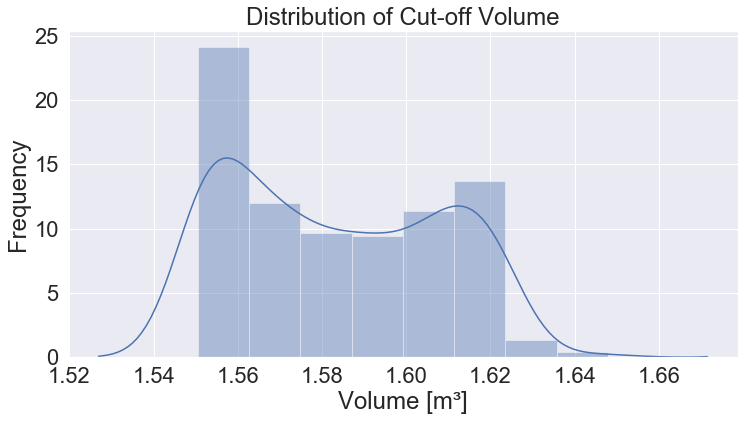

In [144]:
plt.figure(figsize=(12,6))
sns.distplot(df_ART_flow['Cutoff_Volume'])
plt.xlabel('Volume [m³]')
plt.ylabel('Frequency')
plt.title('Distribution of Cut-off Volume');

In [145]:
# Calculate ART for each parcel in hours
df_ART_flow['ART_flow'] = round((df_ART_flow['Arrival'] - df_ART_flow['Departure']).astype('timedelta64[m]')/60,2)
df_ART_flow.head()

,Departure,Arrival,Cutoff_Volume,ART_flow
0,2019-11-14 01:02:00,2019-11-14 04:03:00,1.595008,3.02
1,2019-11-14 02:02:00,2019-11-14 08:05:00,1.620375,6.05
2,2019-11-14 03:33:00,2019-11-14 09:05:00,1.599305,5.53
3,2019-11-14 04:02:00,2019-11-14 11:04:00,1.613642,7.03
4,2019-11-14 08:02:00,2019-11-14 12:02:00,1.586892,4.00


In [146]:
df_ART_flow.describe()

,Cutoff_Volume,ART_flow
count,425.000000,425.000000
mean,1.583311,4.522565
std,0.024870,3.252677
min,1.550458,0.230000
25%,1.560307,2.520000
50%,1.580337,3.500000
75%,1.606312,6.980000
max,1.647940,32.930000


In [147]:
# Departure and arrival curve
test = df_ART_flow.set_index('Arrival').loc['2019-11-26']

test['Departure'] == test['Departure'].apply(lambda x: x.time())


fig = make_subplots()

fig.add_trace(go.Scatter(
    x=test.index,
    y=test['Departure'],
    mode='lines+markers',
    name='Residence time: 1 - 4 hours', marker=dict(
        size=0.5)
), secondary_y = False)

art_long = test[test['ART_flow'] >= 5]

fig.add_trace(go.Scatter(
    x=art_long.index,
    y=art_long['Departure'],
    mode='lines+markers',
    name='Residence time: 5 - 9 hours', marker=dict(
        size=0.5)
), secondary_y = False)



# Add figure title
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
))


fig.update_yaxes(title_text="Departure")
fig.update_xaxes(title_text="Arrival at end of pipe")

fig.update_xaxes(tickangle = 0)
fig.update_yaxes(nticks=9, tickangle = 0)

fig.update_xaxes(title_font=dict(size=18))
fig.update_yaxes(title_font=dict(size=18))

fig.update_yaxes(tickfont=dict(size=18))
fig.update_xaxes(tickfont=dict(size=18))

fig.update_layout(
    autosize=False,
    width=570,
    height=650)

fig.show()





In [148]:
# Flow Rate data distribution

fig = px.histogram(df_ART_flow, x="ART_flow",
                   nbins = 70,
                   title='Histogram of residence times',
                   labels={'ART_flow':'Retention Time [h]'},
                  histnorm='probability density', 
                   range_x=[0,20])


fig.update_yaxes(tickfont=dict(size=15), 
                 tickangle=0, 
                 title = 'probability')
fig.update_xaxes(tickfont=dict(size=15),
                 tickangle=0 )

fig.update_xaxes(nticks=15)
fig.update_yaxes(nticks=9)

fig.show()

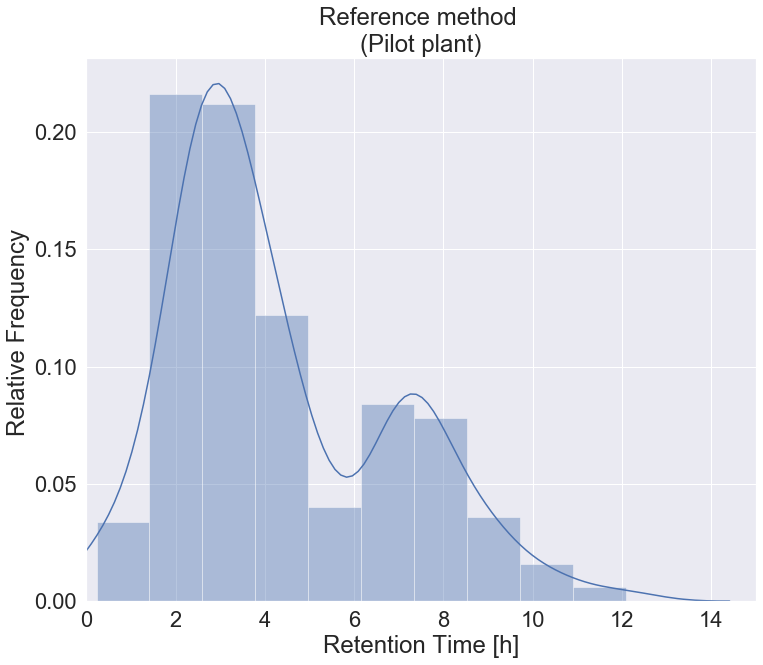

In [149]:
plt.figure(figsize=(12,10))
sns.distplot(df_ART_flow[df_ART_flow['ART_flow'] <= 15]['ART_flow'], bins= 10)


plt.ylabel('Relative Frequency ')
plt.title('Reference method \n(Pilot plant)')


#plt.xticks(np.arange(0,20))
plt.xlim(0,15);

plt.xlabel('Retention Time [h]');
ax.set_ylabel('Relative Frequency',fontsize=18);
sns.set(font_scale = 2)
plt.show()




In [150]:
df_ART_flow.describe()

,Cutoff_Volume,ART_flow
count,425.000000,425.000000
mean,1.583311,4.522565
std,0.024870,3.252677
min,1.550458,0.230000
25%,1.560307,2.520000
50%,1.580337,3.500000
75%,1.606312,6.980000
max,1.647940,32.930000


In [151]:
# Outliers and extreme values
df_ART_flow[(df_ART_flow['ART_flow'] > 15) | 
            (df_ART_flow['ART_flow'] < 1)]

,Departure,Arrival,Cutoff_Volume,ART_flow
72,2019-11-18 12:39:00,2019-11-18 12:59:00,1.567535,0.33
73,2019-11-18 13:13:00,2019-11-18 13:31:00,1.566730,0.30
74,2019-11-18 13:38:00,2019-11-18 13:54:00,1.609530,0.27
75,2019-11-18 14:01:00,2019-11-18 14:15:00,1.642423,0.23
184,2019-11-25 11:39:00,2019-11-25 11:57:00,1.647940,0.30
185,2019-11-25 11:52:00,2019-11-25 12:07:00,1.614467,0.25
186,2019-11-25 12:18:00,2019-11-25 12:49:00,1.568475,0.52
187,2019-11-25 12:22:00,2019-11-25 12:54:00,1.558638,0.53
188,2019-11-25 12:25:00,2019-11-25 12:57:00,1.551370,0.53
189,2019-11-25 12:27:00,2019-11-25 12:59:00,1.551372,0.53


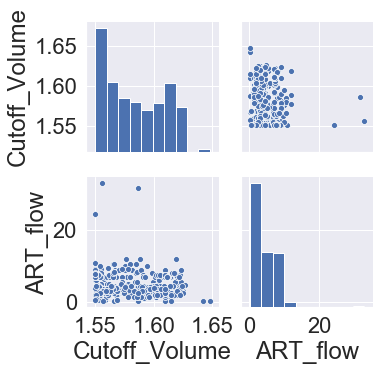

In [152]:
# Plot relationship between cutoff volume and ART
sns.pairplot(df_ART_flow);

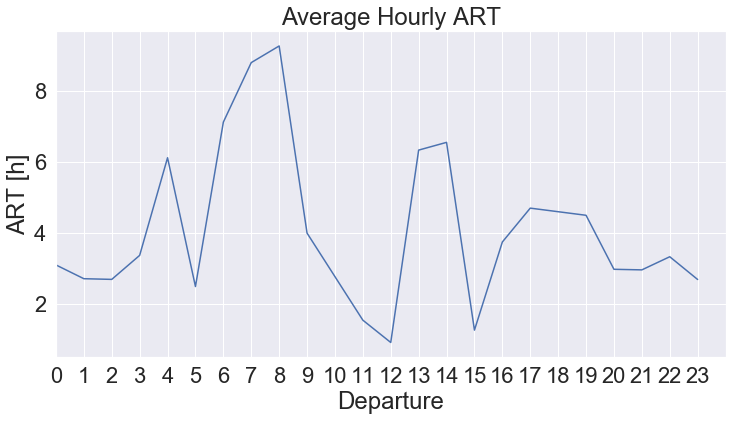

In [153]:
# Plot avg. daily ART - Departure 
daily_ART_flow = df_ART_flow.set_index('Departure')
daily_ART_flow = daily_ART_flow.groupby(daily_ART_flow.index.hour).mean()

plt.figure(figsize=(12,6))
sns.lineplot(x = daily_ART_flow.index, y = daily_ART_flow['ART_flow']);

plt.xlabel('Departure')
plt.ylabel('ART [h]')
plt.title('Average Hourly ART');


plt.xticks(np.arange(0,24))
plt.xlim(0,24);

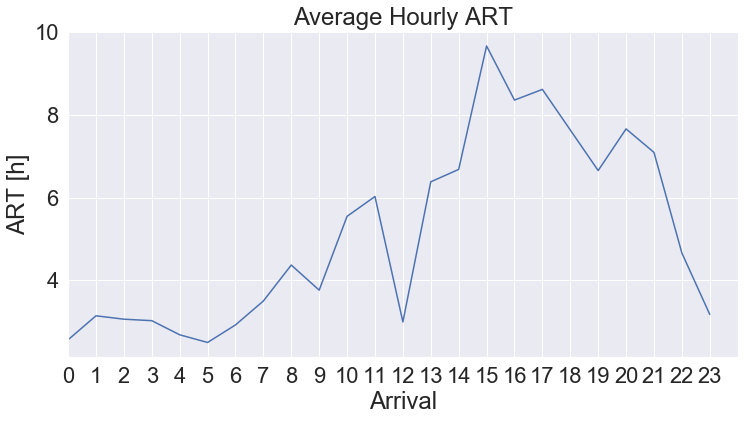

In [154]:
# Plot avg. daily ART - Arrival 
daily_ART_flow = df_ART_flow.set_index('Arrival')
daily_ART_flow = daily_ART_flow.groupby(daily_ART_flow.index.hour).mean()

plt.figure(figsize=(12,6))
sns.lineplot(x = daily_ART_flow.index, y = daily_ART_flow['ART_flow'])

plt.xlabel('Arrival')
plt.ylabel('ART [h]')
plt.title('Average Hourly ART');

plt.xticks(np.arange(0,24))
plt.xlim(0,24);

## 3.2 Temperature Data

In [155]:
df_pump_temp

,Pump_Start,Pump_Stop
2019-11-14 00:00:00,0,0
2019-11-14 00:01:00,0,0
2019-11-14 00:02:00,0,0
2019-11-14 00:03:00,0,0
2019-11-14 00:04:00,0,0
...,...,...
2019-12-11 23:55:00,0,0
2019-12-11 23:56:00,0,0
2019-12-11 23:57:00,0,0
2019-12-11 23:58:00,0,0


In [156]:
# Get avg. Daily flow from flow data
def daily_volume (data):
    day = []
    flow = []
    
    for date in data.index.map(lambda t: t.date()).unique():
        count = 0
        for i in data[data.index.date == date]['Flow_Rate']:
            count += i * 1/60
        day.append(date)
        flow.append(count)
    return round(np.array(flow).mean(),2)

In [157]:
#create dataset with total daily flow for each day
day = []
flow =[]
for date in df_flow.index.map(lambda t: t.date()).unique():
    day.append(str(date))
    flow.append(daily_volume(df_flow.loc[str(date)].dropna()))
    
df_day_flow =pd.DataFrame(data = flow, columns = ['Flow'], index = day)

In [158]:
df_day_flow[(df_day_flow.index != '2019-12-2') &
           (df_day_flow.index != '2019-11-18') &
          (df_day_flow.index != '2019-11-25') ].describe()

,Flow
count,26.000000
mean,7.229615
std,1.362655
min,3.530000
25%,6.780000
50%,7.395000
75%,7.967500
max,10.060000


In [159]:
pump_freq_new = pump_freq[(pump_freq.index != datetime(2019,11,18).date()) &
                     (pump_freq.index != datetime(2019,11,25).date()) &
                         (pump_freq.index != datetime(2019,12,2).date())]


fig = make_subplots(specs=[[{"secondary_y": True}]])
#Choose days to plot


fig.add_trace(go.Scatter(
    x=df_day_flow[(df_day_flow.index != '2020-01-20') &
           (df_day_flow.index != '2020-01-21')].index,
    y=df_day_flow[(df_day_flow.index != '2020-01-20') &
           (df_day_flow.index != '2020-01-21')]['Flow'],
    mode='lines+markers',
    name='Flow volume', marker=dict(
        size=0.5)
), secondary_y = True)



fig.add_trace(go.Bar(
    x=pump_freq.index,
    y=pump_freq['Pump_Start'],name='Pumping event'
), secondary_y = False)


# Legend layout
fig.update_layout(legend=dict(
    orientation="h",
    yanchor="top",
    y=1.15,
    xanchor="left",
    x=0.0
))

fig.update_xaxes(title_font=dict(size=18))
fig.update_yaxes(title_font=dict(size=18))

fig.update_yaxes(tickfont=dict(size=18))
fig.update_xaxes(tickfont=dict(size=18))

# Remove plotting gaps caused by removing outliers
fig.update_xaxes(
    rangebreaks=[
        dict(values=["2019-11-18", "2019-11-25", "2019-12-2"]) 
    ]
)


# Set y-axes titles
fig.update_yaxes(title_text="Daily pumping events", secondary_y=False)
fig.update_yaxes(title_text="Daily flow volume [m³/d]", secondary_y=True)


fig.show()

In [160]:
daily_volume(df_flow)

7.86

In [161]:
#Calculate the number of pump starts it would requier for a parcel to exit the pipe
#avg. daily flow [m³/day]
daily_flow = daily_volume(df_flow)

#avg. number of pump starts per day
pump_starts = round(pump_freq_T['Pump_Start'].mean(),0)

#parcel volume per pump event
discharge_volume = round((daily_flow/pump_starts),2)

#pipe volume in m³
v = round(3.14*200*(0.05**2),2)

print(f'Average Daily Flow = {daily_flow}\nPump Events per day = {pump_starts} m³/day\nParcel Volume = {discharge_volume} m³')

Average Daily Flow = 7.86
Pump Events per day = 15.0 m³/day
Parcel Volume = 0.52 m³


In [162]:
def residence_time(data, q, v):
        import math
        
        departure = []
        arrival = []
        art = []
        for i in range(len(data.index.values)-2):
            start = data.iloc[i].name
            departure.append(start)

            # number of daily pumping events
            d = pump_starts #df_pump_day.loc[start.date()].values[0]
            
            #daily flow devided by d
            a = round((q/d),2) 
            
            # number of pumpevents till discharge
            j = round(v/a,0) 
            
            
            if (i+int(j)) in range(len(data.index.values)):
                        
                stop = data.iloc[i+int(j)].name#+ np.array(freq[:-2]).mean()*(math.modf(j)[0]) ##mean time between pumps
                arrival.append(stop)
                art.append((stop-start))
            
            else:
                break



        if len(departure) > len(arrival):

            d = {'Departure': departure[:len(arrival)],'Arrival':arrival,'ART_temp':art}

        elif len(departure) < len(arrival):  

            d = {'Departure': departure,'Arrival':arrival[len(departure)],'ART_temp':art}

        else:
            d = {'Departure': departure,'Arrival':arrival,'ART_temp':art}

        return pd.DataFrame(data = d)

In [163]:
df_new = pd.DataFrame(data = df_pump_temp[df_pump_temp['Pump_Start'] == 1]['Pump_Start'].values,
                          index = df_pump_temp[df_pump_temp['Pump_Start'] == 1].index, columns= ['Pump_Start'] )

df_ART_temp = residence_time(df_new,daily_flow,v)
df_ART_temp['ART_temp'] = round(df_ART_temp['ART_temp'].astype('timedelta64[m]')/60,2)
df_ART_temp.head()

,Departure,Arrival,ART_temp
0,2019-11-14 01:03:00,2019-11-14 04:03:00,3.00
1,2019-11-14 02:03:00,2019-11-14 07:35:00,5.53
2,2019-11-14 03:33:00,2019-11-14 08:02:00,4.48
3,2019-11-14 04:03:00,2019-11-14 09:03:00,5.00
4,2019-11-14 07:35:00,2019-11-14 11:03:00,3.47


In [164]:
df_ART_temp.describe()

,ART_temp
count,419.000000
mean,4.787637
std,3.182592
min,1.480000
25%,2.520000
50%,3.520000
75%,7.000000
max,31.670000


In [165]:
df_ART_temp.set_index('Arrival').loc['2019-11-26']

,Departure,ART_temp
Arrival,,
2019-11-26 00:04:00,2019-11-25 22:05:00,1.98
2019-11-26 01:04:00,2019-11-25 23:04:00,2.00
2019-11-26 02:04:00,2019-11-25 23:33:00,2.52
2019-11-26 03:04:00,2019-11-26 00:04:00,3.00
2019-11-26 03:35:00,2019-11-26 01:04:00,2.52
2019-11-26 04:04:00,2019-11-26 02:04:00,2.00
2019-11-26 04:34:00,2019-11-26 03:04:00,1.50
2019-11-26 06:04:00,2019-11-26 03:35:00,2.48
2019-11-26 07:04:00,2019-11-26 04:04:00,3.00


In [166]:
# Departure and arrival curve
test_t = df_ART_temp.set_index('Arrival').loc['2019-11-26']

test_t['Departure'] == test_t['Departure'].apply(lambda x: x.time())


fig = make_subplots()

fig.add_trace(go.Scatter(
    x=test_t.index,
    y=test_t['Departure'],
    mode='lines+markers',
    name='Residence time: 1 - 4 hours', marker=dict(
        size=0.5)
), secondary_y = False)

art_long_t = test_t[test_t['ART_temp'] >= 5]

fig.add_trace(go.Scatter(
    x=art_long_t.index,
    y=art_long_t['Departure'],
    mode='lines+markers',
    name='Residence time: 5 - 10 hours', marker=dict(
        size=0.5)
), secondary_y = False)



# Add figure title
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
))

# Set x-axis title
#fig.update_xaxes(title_text="Time [minutes]")

# Set y-axes titles
#fig.update_xaxes(tickangle=90,
                 #tickmode = 'array',
                 #tickvals = test.index,
                 #ticktext= [d.strftime('%H:%M:%S') for d in test.index])

fig.update_yaxes(title_text="Departure from Monkebüde wet-well")
fig.update_xaxes(title_text="Arrival at end of pipe")

fig.update_yaxes(tickfont=dict(size=15))
fig.update_xaxes(tickfont=dict(size=15))

fig.update_xaxes(nticks=15, tickangle = 0)
fig.update_yaxes(nticks=9, tickangle = 0)

fig.show()


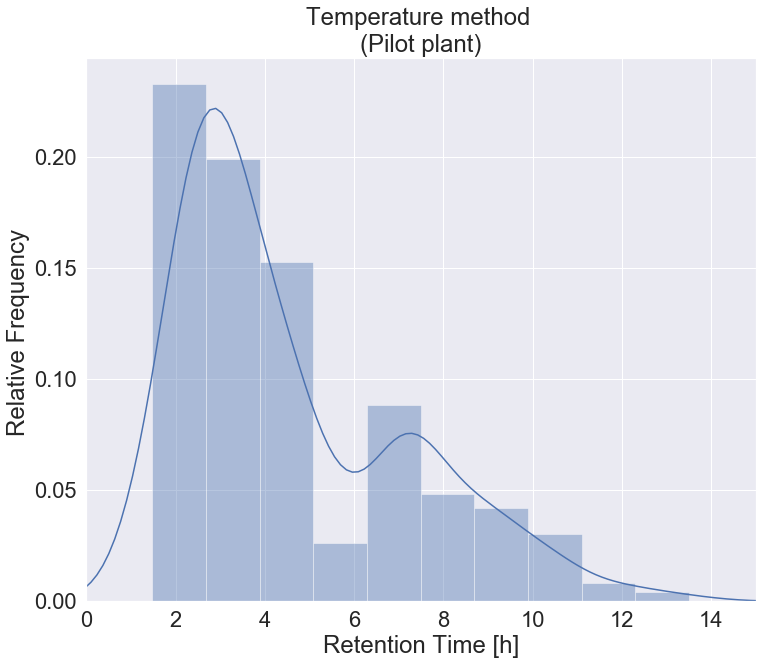

In [167]:
plt.figure(figsize=(12,10))
sns.distplot(df_ART_temp[df_ART_temp['ART_temp'] <= 15]['ART_temp'])

plt.ylabel('Relative Frequency ')
plt.title('Temperature method \n(Pilot plant)')


#plt.xticks(np.arange(0,20))
plt.xlim(0,15);

plt.xlabel('Retention Time [h]');
ax.set_ylabel('Relative Frequency',fontsize=18);
sns.set(font_scale = 2)
plt.show()


In [168]:
df_ART_temp.describe()

,ART_temp
count,419.000000
mean,4.787637
std,3.182592
min,1.480000
25%,2.520000
50%,3.520000
75%,7.000000
max,31.670000


In [169]:
# Outliers and extreme values
df_ART_temp[(df_ART_temp['ART_temp'] > 15) | 
            (df_ART_temp['ART_temp'] < 1)]

,Departure,Arrival,ART_temp
290,2019-12-02 04:36:00,2019-12-02 21:18:00,16.70
291,2019-12-02 07:03:00,2019-12-02 23:41:00,16.63
292,2019-12-02 08:33:00,2019-12-03 16:13:00,31.67
293,2019-12-02 21:18:00,2019-12-03 17:33:00,20.25
294,2019-12-02 23:41:00,2019-12-03 20:33:00,20.87


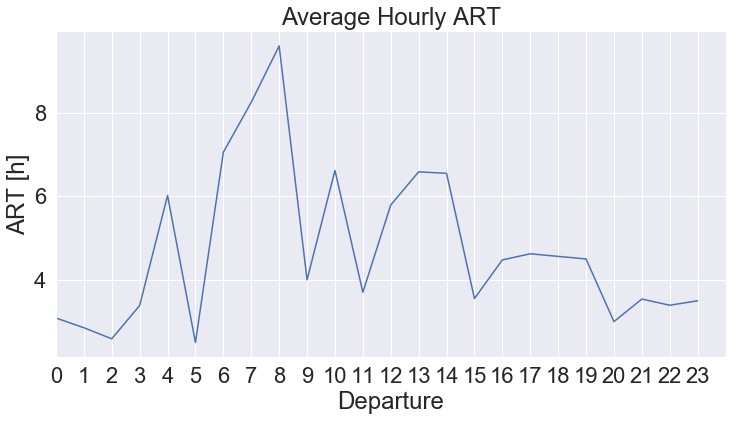

In [170]:
# Plot avg. daily ART - Departure 
daily_ART_temp = df_ART_temp.set_index('Departure')
daily_ART_temp = daily_ART_temp.groupby(daily_ART_temp.index.hour).mean()

plt.figure(figsize=(12,6))
sns.lineplot(x = daily_ART_temp.index, y = daily_ART_temp['ART_temp']);

plt.xlabel('Departure')
plt.ylabel('ART [h]')
plt.title('Average Hourly ART');


plt.xticks(np.arange(0,24))
plt.xlim(0,24);

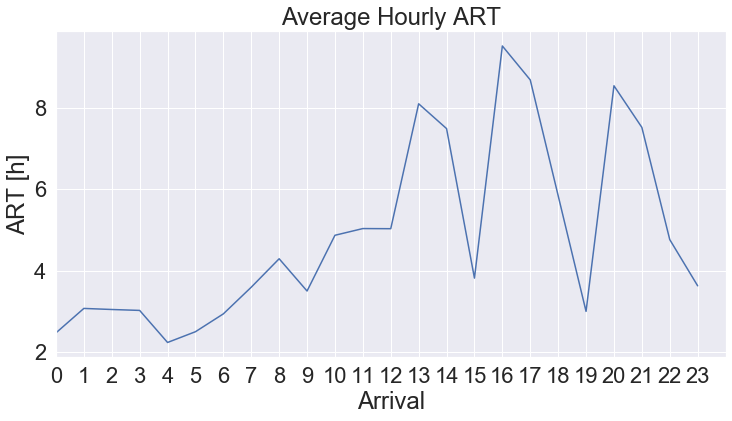

In [171]:
# Plot avg. daily ART - Departure 
daily_ART_temp = df_ART_temp.set_index('Arrival')
daily_ART_temp = daily_ART_temp.groupby(daily_ART_temp.index.hour).mean()

plt.figure(figsize=(12,6))
sns.lineplot(x = daily_ART_temp.index, y = daily_ART_temp['ART_temp']);

plt.xlabel('Arrival')
plt.ylabel('ART [h]')
plt.title('Average Hourly ART');


plt.xticks(np.arange(0,24))
plt.xlim(0,24);

## Chapter 4 - Comparing Results

## 4.1 Departure ART

In [172]:
# create one dataframe with art flow & art temp


# set arrival as index
df_ART_temp_de = df_ART_temp.set_index('Departure')
df_ART_flow_de = df_ART_flow.set_index('Departure')

# Removing duplicate index values 
df_ART_temp_de = df_ART_temp_de[~df_ART_temp_de.index.duplicated(keep='first')]
df_ART_flow_de = df_ART_flow_de[~df_ART_flow_de.index.duplicated(keep='first')]


# join datasets 
art_data = pd.concat([df_ART_flow_de,
                      df_ART_temp_de], axis = 1)

art_data.drop(['Arrival', 'Cutoff_Volume', 'Arrival'], axis =1, inplace = True)


# Resample every hour per day
df_grouped_de = art_data.groupby([art_data.index.date, art_data.index.hour]).mean()
df_grouped_de.rename_axis(index=['Date', 'Time'], inplace = True)

#check for null values
df_grouped_de.dropna(inplace = True)

df_grouped_de.head()

ART_flow  ART_temp
Date       Time                    
2019-11-14 1         3.02      3.00
           2         6.05      5.53
           3         5.53      4.48
           4         7.03      5.00
           8         4.00      4.02

In [173]:
#convert index to date time - this makes it easier to plot
departure_art = df_grouped_de.reset_index()
departure_art['Date']= departure_art['Date'].apply(lambda x: str(x))
departure_art['Time']= departure_art['Time'].apply(lambda x: str(x)+ ':00:00')
departure_art.index = pd.to_datetime(departure_art['Date'] + ' ' + departure_art['Time'])
departure_art.drop(['Date','Time'], axis = 1, inplace = True)

In [174]:
#departure_art.iplot(xTitle = 'Date',yTitle='Departure ART [h]',theme='ggplot')

fig = make_subplots()

fig.add_trace(go.Scatter(
    x=departure_art.index,
    y=departure_art['ART_flow'],
    mode='lines+markers',
    name='ART-flow', marker=dict(
        size=0.5)
), secondary_y = False)


fig.add_trace(go.Scatter(
    x=departure_art.index,
    y=departure_art['ART_temp'],
    mode='lines+markers',
    name='ART-temp', marker=dict(
        size=0.5)
), secondary_y = False)
             

# Add figure title
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
))


fig.update_yaxes(title_text="ART [h]")
fig.update_xaxes(title_text="Departure time")

fig.update_yaxes(tickfont=dict(size=15))
fig.update_xaxes(tickfont=dict(size=15))

fig.update_xaxes(nticks=20, tickangle = 45)
fig.update_yaxes(nticks=9, tickangle = 0)


fig.show()

In [175]:
residuals = departure_art['ART_temp']-departure_art['ART_flow']
print (round(np.mean(abs(residuals/departure_art['ART_flow'])),3))

0.196


In [176]:
avg_departure_art = departure_art.groupby(departure_art.index.hour).mean()

#Change indox to string so that the plotted ticks are in the format '00:00'
avg_departure_art.index = pd.to_datetime(avg_departure_art.index, format= '%H').map(lambda x : str(x.time())[0:5]) 

fig = make_subplots()

fig.add_trace(go.Scatter(
    x=avg_departure_art.index,
    y=avg_departure_art['ART_flow'],
    mode='lines+markers',
    name='ART-flow', marker=dict(
        size=0.5)
), secondary_y = False)


fig.add_trace(go.Scatter(
    x=avg_departure_art.index,
    y=avg_departure_art['ART_temp'],
    mode='lines+markers',
    name='ART-temp', marker=dict(
        size=0.5)
), secondary_y = False)
             

# Add figure title
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
))


fig.update_yaxes(title_text="ART [h]")
fig.update_xaxes(title_text="Departure time")

fig.update_yaxes(tickfont=dict(size=15))
fig.update_xaxes(tickfont=dict(size=15))

fig.update_xaxes(nticks=23, tickangle = 0)
fig.update_yaxes(nticks=10, tickangle = 0)


fig.show()

In [177]:
residuals = departure_art.groupby(departure_art.index.hour).mean()['ART_temp']-departure_art.groupby(departure_art.index.hour).mean()['ART_flow']
print (round(np.mean(abs(residuals/departure_art.groupby(departure_art.index.hour).mean()['ART_flow'])),2))

0.16


In [178]:
#ouliers
df_ART_flow[df_ART_flow['ART_flow'] >25]['Departure']

294   2019-12-02 07:01:00
295   2019-12-02 08:31:00
Name: Departure, dtype: datetime64[ns]

In [179]:
#Drop dates where pumping duration was > 10 minutes
df_new_de = departure_art[(departure_art.index.date != datetime(2019,11,18).date())
                       & (departure_art.index.date != datetime(2019,11,25).date())
                       &(departure_art.index.date != datetime(2019,12,2).date())]

In [180]:
fig = make_subplots()
#df_new_de.index = df_new_de.index.strftime("%Y-%m-%d %H")

fig.add_trace(go.Scatter(
    x=df_new_de.index.map(str),
    y=df_new_de['ART_flow'].values,
    mode='lines+markers',
    name='ART-flow', marker=dict(
        size=0.5)
), secondary_y = False)


fig.add_trace(go.Scatter(
    x=df_new_de.index.map(str),
    y=df_new_de['ART_temp'].values,
    mode='lines+markers',
    name='ART-temp', marker=dict(
        size=0.5)
), secondary_y = False)
             

# Add figure title
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
))


# Set y-axes titles

#fig.layout.xaxis.type = 'category'

# Remove plotting gaps where there is no data
fig.update_xaxes(
    rangebreaks=[
        dict(values=["2019-11-18", "2019-11-25", "2019-12-2","2019-12-3" ]) 
    ]
)

fig.update_layout(title_text = 'Pilot plant', title_x=0.5)
fig.update_yaxes(title_text="ART [h]")
fig.update_xaxes(title_text="Departure time")

fig.update_yaxes(tickfont=dict(size=15))
fig.update_xaxes(tickfont=dict(size=15))

fig.update_xaxes(nticks=30, tickangle = 45)
fig.update_yaxes(nticks=9, tickangle = 0)

fig.update_xaxes(title_font=dict(size=18))
fig.update_yaxes(title_font=dict(size=18))

fig.show()

In [181]:
#RMSE in %
y_true = df_new_de['ART_flow']
y_pred = df_new_de['ART_temp']

rmspe = (np.sqrt(np.mean(np.square((y_true - y_pred) / y_true)))) * 100

print(f'The root mean squared precent error is: \n{round((rmspe),2)}%')

The root mean squared precent error is: 
15.58%


In [182]:
avg_departure_art_new = df_new_de.groupby(df_new_de.index.hour).mean()

#Change indox to string so that the plotted ticks are in the format '00:00'
avg_departure_art_new.index = pd.to_datetime(avg_departure_art_new.index, format= '%H').map(lambda x : str(x.time())[0:5]) 


fig = make_subplots()

fig.add_trace(go.Scatter(
    x=avg_departure_art_new.index,
    y=avg_departure_art_new['ART_flow'],
    mode='lines+markers',
    name='ART-flow', marker=dict(
        size=0.5)
), secondary_y = False)


fig.add_trace(go.Scatter(
    x=avg_departure_art_new.index,
    y=avg_departure_art_new['ART_temp'],
    mode='lines+markers',
    name='ART-temp', marker=dict(
        size=0.5)
), secondary_y = False)
             

# Add figure title
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
))


fig.update_yaxes(title_text="ART [h]")
fig.update_xaxes(title_text="Departure time")

fig.update_yaxes(tickfont=dict(size=15))
fig.update_xaxes(tickfont=dict(size=15))

fig.update_xaxes(nticks=23,tickangle = 0)
fig.update_yaxes(nticks=9, tickangle = 0)

fig.show()

In [183]:
residuals =df_new_de.groupby(df_new_de.index.hour).mean()['ART_temp']-df_new_de.groupby(df_new_de.index.hour).mean()['ART_flow']
mspe = round(np.mean(abs(residuals/df_new_de.groupby(df_new_de.index.hour).mean()['ART_flow'])),2)*100
print(f'The root mean precent error is: \n{(mspe)}%')

The root mean precent error is: 
2.0%


In [184]:
# RMSE in hours
from sklearn import metrics
print('RMSE:', np.sqrt(metrics.mean_squared_error(df_new_de.groupby(df_new_de.index.hour).mean()['ART_flow'],
                                                  df_new_de.groupby(df_new_de.index.hour).mean()['ART_temp'])))

RMSE: 0.18846898886827781


In [185]:
#RMSE in %
y_true = df_new_de.groupby(df_new_de.index.hour).mean()['ART_flow']
y_pred = df_new_de.groupby(df_new_de.index.hour).mean()['ART_temp']

rmspe = (np.sqrt(np.mean(np.square((y_true - y_pred) / y_true)))) * 100

print(f'The root mean squared precent error is: \n{round((rmspe),2)}%')

The root mean squared precent error is: 
2.88%


## 4.1 Arrival ART

In [186]:
# create one dataframe with art flow & art temp

# set arrival as index
df_ART_temp_ar = df_ART_temp.set_index('Arrival')
df_ART_flow_ar = df_ART_flow.set_index('Arrival')

# Removing duplicate index values 
df_ART_temp_ar = df_ART_temp_ar[~df_ART_temp_ar.index.duplicated(keep='first')]
df_ART_flow_ar = df_ART_flow_ar[~df_ART_flow_ar.index.duplicated(keep='first')]


# join datasets 
art_data = pd.concat([df_ART_flow_ar,
                      df_ART_temp_ar], axis = 1)

art_data.drop(['Departure', 'Cutoff_Volume', 'Departure'], axis =1, inplace = True)


# Resample every hour per day
df_grouped_ar = art_data.groupby([art_data.index.date, art_data.index.hour]).mean()
df_grouped_ar.rename_axis(index=['Date', 'Time'], inplace = True)

#check for null values
df_grouped_ar.dropna(inplace = True)

df_grouped_ar.head()

ART_flow  ART_temp
Date       Time                    
2019-11-14 4         3.02      3.00
           8         6.05      4.48
           9         5.53      5.00
           11        7.03      3.47
           12        4.00      4.02

In [187]:
#convert index to date time - this makes it easier to plot
arrival_art = df_grouped_ar.reset_index()
arrival_art['Date']= arrival_art['Date'].apply(lambda x: str(x))
arrival_art['Time']= arrival_art['Time'].apply(lambda x: str(x)+ ':00:00')
arrival_art.index = pd.to_datetime(arrival_art['Date'] + ' ' + arrival_art['Time'])
arrival_art.drop(['Date','Time'], axis = 1, inplace = True)

In [188]:

fig = make_subplots()

fig.add_trace(go.Scatter(
    x=arrival_art.index,
    y=arrival_art['ART_flow'],
    mode='lines+markers',
    name='ART-flow', marker=dict(
        size=0.5)
), secondary_y = False)


fig.add_trace(go.Scatter(
    x=arrival_art.index,
    y=arrival_art['ART_temp'],
    mode='lines+markers',
    name='ART-temp', marker=dict(
        size=0.5)
), secondary_y = False)
             

# Add figure title
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
))


fig.update_yaxes(title_text="ART [h]")
fig.update_xaxes(title_text="Arrival time")

fig.update_yaxes(tickfont=dict(size=15))
fig.update_xaxes(tickfont=dict(size=15))

fig.update_xaxes(nticks=30,tickangle = 45)
fig.update_yaxes(nticks=9, tickangle = 0)

fig.show()

In [189]:
residuals = arrival_art['ART_temp']-arrival_art['ART_flow']
print (round(np.mean(abs(residuals/arrival_art['ART_flow'])),3))

0.079


In [190]:
#RMSE in %
arrival_art['ART_flow'] = arrival_art['ART_flow'].round(2)

y_true = arrival_art['ART_flow'].values
y_pred = arrival_art['ART_temp'].values

rmspe = (np.sqrt(np.mean(np.square((y_pred - y_true) / y_true)))) * 100

print(f'The root mean squared precent error is: \n{round((rmspe),2)}%')

The root mean squared precent error is: 
54.37%


In [191]:
arrival_art

,ART_flow,ART_temp
2019-11-14 04:00:00,3.02,3.00
2019-11-14 08:00:00,6.05,4.48
2019-11-14 09:00:00,5.53,5.00
2019-11-14 11:00:00,7.03,3.47
2019-11-14 12:00:00,4.00,4.02
...,...,...
2019-12-11 13:00:00,7.92,9.00
2019-12-11 20:00:00,7.00,7.00
2019-12-11 21:00:00,7.00,7.00
2019-12-11 22:00:00,4.50,4.52


In [192]:
avg_arrival_art = arrival_art.groupby(arrival_art.index.hour).mean()

#Change indox to string so that the plotted ticks are in the format '00:00'
avg_arrival_art.index = pd.to_datetime(avg_arrival_art.index, format= '%H').map(lambda x : str(x.time())[0:5]) 

fig = make_subplots()

fig.add_trace(go.Scatter(
    x=avg_arrival_art.index,
    y=avg_arrival_art['ART_flow'],
    mode='lines+markers',
    name='ART-flow', marker=dict(
        size=0.5)
), secondary_y = False)


fig.add_trace(go.Scatter(
    x=avg_arrival_art.index,
    y=avg_arrival_art['ART_temp'],
    mode='lines+markers',
    name='ART-temp', marker=dict(
        size=0.5)
), secondary_y = False)
             

# Add figure title
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
))


fig.update_yaxes(title_text="ART [h]")
fig.update_xaxes(title_text="Arrival time")

fig.update_yaxes(tickfont=dict(size=15))
fig.update_xaxes(tickfont=dict(size=15))

fig.update_xaxes(nticks=23,tickangle = 0)
fig.update_yaxes(nticks=10, tickangle = 0)

fig.show()


In [193]:
#Drop dates where pumping duration was > 10 minutes
df_new_ar = arrival_art[(arrival_art.index.date != datetime(2019,11,18).date())
                       & (arrival_art.index.date != datetime(2019,11,25).date())
                         &(arrival_art.index.date != datetime(2019,11,14).date())
                         &(arrival_art.index.date != datetime(2019,12,3).date())]




In [194]:
fig = make_subplots()

fig.add_trace(go.Scatter(
    x=df_new_ar.index.map(str),
    y=df_new_ar['ART_flow'].values,
    mode='lines+markers',
    name='ART-flow', marker=dict(
        size=0.5)
), secondary_y = False)


fig.add_trace(go.Scatter(
    x=df_new_ar.index.map(str),
    y=df_new_ar['ART_temp'].values,
    mode='lines+markers',
    name='ART-temp', marker=dict(
        size=0.5)
), secondary_y = False)
             

# Add figure title
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.84
),font=dict(size=18))


# Remove plotting gaps caused by removing outliers
fig.update_xaxes(
    rangebreaks=[
        dict(values=["2019-11-18", "2019-11-25", "2019-11-14","2019-12-3" ]) 
    ]
)


fig.update_yaxes(title_text="ART [h]")
fig.update_xaxes(title_text="Arrival time")

fig.update_yaxes(tickfont=dict(size=18))
fig.update_xaxes(tickfont=dict(size=18))

fig.update_xaxes(nticks=40,tickangle = 45)
fig.update_yaxes(nticks=9, tickangle = 0)


fig.update_xaxes(title_font=dict(size=18))
fig.update_yaxes(title_font=dict(size=18))


fig.update_layout(
    autosize=False,
    width=1000,
    height=650)

fig.show()

In [195]:
residuals = df_new_ar['ART_temp']-df_new_ar['ART_flow']
mspe = round(np.mean(abs(residuals/df_new_ar['ART_flow'])),2)*100
print(f'The root mean precent error is: \n{(mspe)}%')

The root mean precent error is: 
4.0%


In [196]:
residuals.mean()

-0.0182068965517241

In [197]:
#RMSE in %
y_true = df_new_ar['ART_flow'].values
y_pred = df_new_ar['ART_temp'].values

rmspe = (np.sqrt(np.mean(np.square((y_true - y_pred).round(2) / y_true)))) * 100

print(f'The root mean squared precent error is: \n{round((rmspe),2)}%')

The root mean squared precent error is: 
11.8%


In [198]:
avg_arrival_art_new = df_new_ar.groupby(df_new_ar.index.hour).mean()

#Change indix to string so that the plotted ticks are in the format '00:00'
avg_arrival_art_new.index = pd.to_datetime(avg_arrival_art_new.index, format= '%H').strftime('%H:%M')

fig = make_subplots()

fig.add_trace(go.Scatter(
    x=avg_arrival_art_new.index,
    y=avg_arrival_art_new['ART_flow'],
    mode='lines+markers',
    name='ART-flow', marker=dict(
        size=0.5)
), secondary_y = False)


fig.add_trace(go.Scatter(
    x=avg_arrival_art_new.index,
    y=avg_arrival_art_new['ART_temp'],
    mode='lines+markers',
    name='ART-temp', marker=dict(
        size=0.5)
), secondary_y = False)
    
    
# Add figure title
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
),font=dict(size=18))


fig.update_yaxes(title_text="ART [h]")
fig.update_xaxes(title_text="Arrival time")

fig.update_yaxes(tickfont=dict(size=18))
fig.update_xaxes(tickfont=dict(size=18))

fig.update_xaxes(nticks=20,tickangle = 45)
fig.update_yaxes(nticks=9, tickangle = 0)


fig.update_xaxes(title_font=dict(size=18))
fig.update_yaxes(title_font=dict(size=18))


fig.update_layout(
    autosize=False,
    width=700,
    height=650)



fig.show()

In [199]:
residuals =avg_arrival_art_new['ART_temp']-avg_arrival_art_new['ART_flow']
mspe = round(np.mean(abs(residuals/avg_arrival_art_new['ART_flow'])),2)*100
print(f'The root mean precent error is: \n{(mspe)}%')

The root mean precent error is: 
2.0%


In [200]:
y_true = avg_arrival_art_new['ART_flow']
y_pred = avg_arrival_art_new['ART_temp']

rmspe = (np.sqrt(np.mean(np.square((y_true - y_pred) / y_true)))) * 100

print(f'The root mean squared precent error is: \n{round((rmspe),2)}%')

The root mean squared precent error is: 
2.63%


## Average ART-arrival curve with typical pumping pattern

In [201]:
# avg ART-arrival with typical pump events
fig = make_subplots(specs=[[{"secondary_y": True}]])

#choose pumping pattern to plot

day = '2019-11-17'

#make dataframe

oneday_pump = df_ART_flow_de.loc[day].drop('ART_flow', axis = 1)
oneday_pump.index = df_ART_flow_de.loc[day].index = pd.to_datetime(oneday_pump.index, format= '%y-%m-%d %H:%M:%S').strftime('%H:%M')

new_df = pd.concat([avg_arrival_art_new,oneday_pump], axis = 1)
new_df.index = pd.to_datetime(new_df.index, format= '%H:%M')
new_df.sort_index(inplace= True)
new_df.index = pd.to_datetime(new_df.index, format= '%y-%m-%d %H:%M:%S')#.strftime('%H:%M')


fig.add_trace(go.Scatter(
    x=new_df[new_df['ART_flow'] >= 0].index,
    y=new_df[new_df['ART_flow'] >= 0]['ART_flow'],
    mode='lines+markers',
    name='ART-flow', marker=dict(
        size=0.5)
), secondary_y = False)
    



    
# Add pumping events


fig.add_trace(go.Scatter(
    x= new_df[new_df['Cutoff_Volume'] > 0].index,
    y=np.ones(len(new_df[new_df['Cutoff_Volume'] > 0].index))*0.5,
    mode='markers',
    name='Pump Event', marker=dict(
        size=10,
        color='red',
        symbol='triangle-up')
),secondary_y = True)
    

# Legend layout
fig.update_layout(legend=dict(
    orientation="h",
    yanchor="top",
    y=1.1,
    xanchor="left",
    x=0.0
))


fig.update_yaxes(tickfont=dict(size=15), title = 'RT [h]')
fig.update_xaxes(tickfont=dict(size=15))

fig.update_xaxes(nticks=20,tickangle = 45)
fig.update_yaxes(nticks=20, tickangle = 0)

fig.update_yaxes(visible=False, 
                 showticklabels=False, 
                 secondary_y = True)


fig.update_xaxes(title_font=dict(size=18))
fig.update_yaxes(title_font=dict(size=18))

fig.update_layout(
    autosize=False,
    width=570,
    height=550)

fig.show()

## 4.3 Arrival / Departure curve of one day

In [202]:
# Departure and arrival curve
test = df_ART_flow.set_index('Arrival').loc['2019-11-16']
test_t = df_ART_temp.set_index('Arrival').loc['2019-11-16']

test['Departure'] == test['Departure'].apply(lambda x: x.time())
test_t['Departure'] == test_t['Departure'].apply(lambda x: x.time())


fig = make_subplots()

fig.add_trace(go.Scatter(
    x=test.index,
    y=test['Departure'],
    mode='lines+markers',
    name='ART_flow', marker=dict(
        size=0.5)
), secondary_y = False)


fig.add_trace(go.Scatter(
    x=test_t.index,
    y=test_t['Departure'],
    mode='lines+markers',
    name='ART_temp', marker=dict(
        size=0.5)
), secondary_y = False)



# Add figure title
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
))




fig.update_yaxes(title_text="Departure from Monkebüde wet-well")
fig.update_xaxes(title_text="Arrival at end of pipe")

fig.update_yaxes(tickfont=dict(size=15))
fig.update_xaxes(tickfont=dict(size=15))

fig.update_xaxes(nticks=23,tickangle = 0)
fig.update_yaxes(nticks=10, tickangle = 0)

fig.show()


## 4.4 Pumping events

In [203]:
fig = go.Figure(data=[
    go.Bar(name='Pump events - actual', x=pump_freq.index, y=pump_freq['Pump_Start'],
           ),
    go.Bar(name='Pump events - temp', x=pump_freq_T.index, y=pump_freq_T['Pump_Start'],
          )
])

# Add figure title
fig.update_layout(legend=dict(
    yanchor="top",
    orientation="h",
    y= 1.11,
    xanchor="left",
    x=0
),font=dict(size=18))

fig.update_layout(title_text ='Pilot plant', title_x=0.5, title_y=0.98)

fig.update_yaxes(title_text="Pump events")
fig.update_xaxes(title_text="Day")

fig.update_yaxes(tickfont=dict(size=18))
fig.update_xaxes(tickfont=dict(size=18))

fig.update_xaxes(title_font=dict(size=18))
fig.update_yaxes(title_font=dict(size=18))


fig.update_xaxes(nticks=25,tickangle = 45)
fig.update_yaxes(nticks=15, tickangle = 0)


fig.update_layout(
    autosize=False,
    width=1000,
    height=650)

fig.show()

In [204]:
# RMSE of pumping events

y_true_p = pump_freq['Pump_Start']
y_pred_p = pump_freq_T['Pump_Start']

rmspe = (np.sqrt(np.mean(np.square((y_true - y_pred) / y_true)))) * 100

print(f'The root mean squared precent error is: \n{round((rmspe),2)}%')

The root mean squared precent error is: 
2.63%


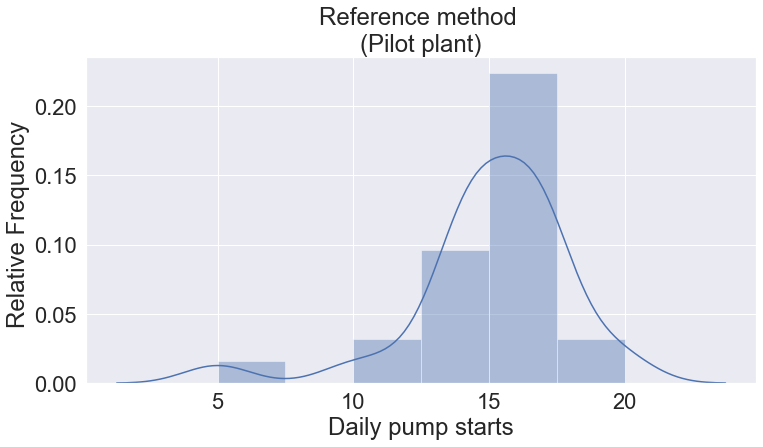

In [205]:
plt.figure(figsize=(12,6))
sns.distplot(pump_freq_new['Pump_Start'], bins = 6)

plt.ylabel('Relative Frequency ')
plt.title('Reference method \n(Pilot plant)')


plt.xlabel('Daily pump starts');
sns.set(font_scale = 2)
plt.show()

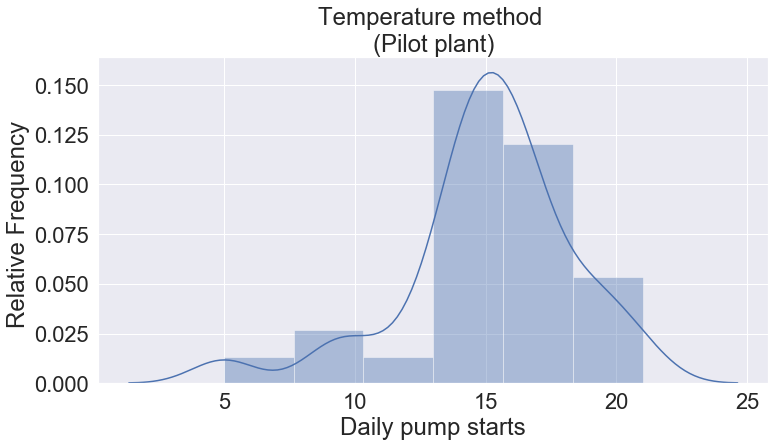

In [206]:
plt.figure(figsize=(12,6))
sns.distplot(pump_freq_T['Pump_Start'], bins = 6)

plt.ylabel('Relative Frequency ')
plt.title('Temperature method \n(Pilot plant)')


#plt.xticks(np.arange(8,25))
#plt.xlim(8,25);

plt.xlabel('Daily pump starts');
sns.set(font_scale = 2)
plt.show()

## Chapter 5 - Probability & Statistical Analysis

## 5.1 Probability analysis

Here i will test the probability of a change in temperature occuring given that a pumping event already occured

In [207]:
# Remove known outliers found during EDA

pump_flow = pump_start[(pump_start.index.date != datetime(2019,11,18).date())
                       & (pump_start.index.date != datetime(2019,11,25).date())
                       & (pump_start.index.date != datetime(2019,12,2).date())]

pump_temp = df_pump_temp[(df_pump_temp.index.date != datetime(2019,11,18).date())
                       & (df_pump_temp.index.date != datetime(2019,11,25).date())
                       & (df_pump_temp.index.date != datetime(2019,12,2).date())]

In [208]:
df1 = pump_temp[pump_temp['Pump_Start'] == 1]
df1.drop('Pump_Stop', axis = 1, inplace = True)

df2 = pump_flow[pump_flow['Pump_Start'] == 1]
df2.drop('Flow_Rate', axis = 1, inplace = True)

In [209]:
# array of time stamps of every pumping event
timestamp_pump = df2.index

# array of time stamps of where no pumping event occured
timestamp_NOpump = pump_flow[pump_flow['Pump_Start'] == 0]['Pump_Start'].index

# array of time stamps of every local minima in temperature data
timestamp_peak = df1.index

In [210]:
len(timestamp_peak)

379

In [211]:
#function to add minutes to a timestamp (datetime.time object)
def addMins(tm, mins):
    fulldate = datetime(tm.year, tm.month, tm.day, tm.hour, tm.minute, tm.second)
    fulldate = fulldate + timedelta(minutes=mins)
    return fulldate


def pump_prob(pump_times, peaks, minutes = 3):
    #Check if peak in temperature occurs within x minutes of pump event or no

    mins = []
    count_list = []
    i = 0

    while i in range (len(pump_times)):

        count = False
        for j in range(0,minutes+1):

            if addMins(pump_times[i],j )in peaks:
                count = True
                # remove time stamp from peaks 
                peaks = peaks.delete(peaks.get_loc(addMins(pump_times[i],j)))
                mins.append(j)

        if count:
            count_list.append('Yes')
        else:
            count_list.append('No')

            
        i+=1

    print(peaks)
    return (pd.DataFrame(data = np.array(count_list), columns=['value']), mins)

DatetimeIndex(['2019-11-14 07:35:00', '2019-11-15 15:30:00',
               '2019-11-20 15:52:00', '2019-11-20 16:28:00',
               '2019-11-27 06:05:00', '2019-11-27 10:57:00',
               '2019-11-28 07:04:00', '2019-12-03 16:13:00',
               '2019-12-09 00:09:00'],
              dtype='datetime64[ns]', freq=None)


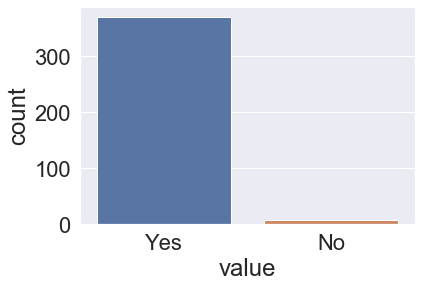

In [212]:
#Detecting minima within x minutes of pumping event

df_prob1, mins = pump_prob(timestamp_pump,timestamp_peak,minutes = 15)
sns.countplot(x = 'value', data = df_prob1 );


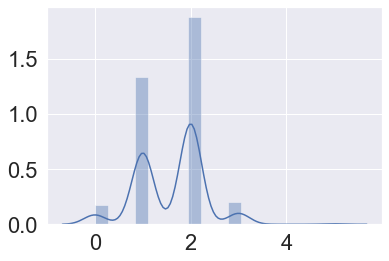

In [213]:
sns.distplot(np.array(mins));

DatetimeIndex([], dtype='datetime64[ns]', freq=None)


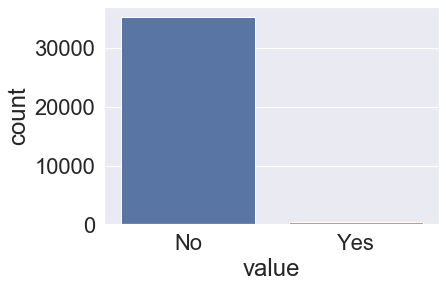

In [214]:
## Detecting minima within x minutes of no pumping event

df_prob2 = pump_prob(timestamp_NOpump,timestamp_peak,minutes = 1)[0]
sns.countplot(x = 'value', data = df_prob2 );

In [215]:
yes = df_prob1['value'].value_counts()['Yes']
no = df_prob1['value'].value_counts()['No']

yes_NoPump = df_prob2['value'].value_counts()['Yes']
no_NoPump = df_prob2['value'].value_counts()['No']

d = {'Minima_temp' : [yes,yes_NoPump], 'No_minima_Temp' : [no,no_NoPump]}
df_prob = pd.DataFrame(data = d, index = ['Pump Event','No Pump Event'])
df_prob['Total'] = df_prob['Minima_temp'] + df_prob['No_minima_Temp']
df_prob

,Minima_temp,No_minima_Temp,Total
Pump Event,370,7,377
No Pump Event,379,35244,35623


### Conditional probability formula

https://www.khanacademy.org/math/statistics-probability/probability-library/conditional-probability-independence/a/conditional-probability-using-two-way-tables


**P(peak ∣ pump) = P(peak and pump)/P( pump)**

In [216]:
p_peakpump = df_prob['Minima_temp'][0]/sum(df_prob['Total'])
p_pump = df_prob['Total'][0] / sum(df_prob['Total'])

prob = p_peakpump/p_pump
print(f'The probability of a peak in temperature occuring given that \na pumping event already occured is: \n\n{round(prob,2)}')

The probability of a peak in temperature occuring given that 
a pumping event already occured is: 

0.98


In [217]:
p_peakpump = df_prob['Minima_temp'][0]/sum(df_prob['Total'])
p_Nopump = df_prob['Total'][1] / sum(df_prob['Total'])

prob = p_peakpump/p_Nopump
print(f'The probability of a peak in temperature occuring given that \na pumping event did not occur is: \n\n{round(prob,2)}')

The probability of a peak in temperature occuring given that 
a pumping event did not occur is: 

0.01


In [218]:
# Plot showing within which amount of minutes of a pumping events are tmperature changes detected
df_mins = pd.DataFrame(np.array(mins), columns= ['min'])
df_mins['count'] = np.ones(len(df_mins.index))

fig = px.bar(df_mins.groupby(['min']).sum(), y='count',
             x=df_mins.groupby(['min']).sum().index)

fig.update_xaxes(title_text="Time [min]")

fig.update_yaxes(tickfont=dict(size=15))
fig.update_xaxes(tickfont=dict(size=15))

fig.update_xaxes(nticks=10,tickangle = 0)
fig.update_yaxes(nticks=15, tickangle = 0)

fig.update_layout(
    autosize=False,
    width=570,
    height=550)

fig.show()

In [117]:
#Plot of temperature and flow rate 

fig = make_subplots(specs=[[{"secondary_y": True}]])

#Choose days to plot

start = '2019-11-26'
stop = '2019-11-26'


#fig.add_trace(go.Scatter(
    #x=fx[start:stop].index,
    #y=fx['T_ww'][start:stop],
    #mode='lines+markers',
    #name='Original Plot', marker=dict(
        #size=0.5)
#), secondary_y = False)



fig.add_trace(go.Scatter(
    x=fx[start:stop].index,
    y=fx[f'EWMA{best_fit[0]}'][start:stop],
    mode='lines+markers',
    name='Temperature [°C]', marker=dict(
        size=0.1, color = 'orange')
),secondary_y=True)



# Add traces
fig.add_trace(go.Scatter(x=data.loc['2019-11-26'].index, 
               y=data.loc['2019-11-26']['Q'], 
               name="Flow Rate [m³/h]", marker=dict(
        color='blue')),secondary_y=False)





fig.add_trace(go.Scatter(
    x=fx[start:stop].index,
    y=fx['Minima'][start:stop],
    mode='markers',
    marker=dict(
        size=10,
        color='red',
        symbol='cross'
    ),
    name='Detected temperature shift'
), secondary_y = True)


#fig.add_trace(go.Scatter(
    #x=fx[start:stop].index,
    #y=fx['Peak'][start:stop],
    #mode='markers',
    #marker=dict(
        #size=10,
        #color='blue',
        #symbol='cross'
    #),
   # name='Temperature peak'
#), secondary_y = True)


# Legend layout
fig.update_layout(legend=dict(
    orientation="h",
    yanchor="top",
    y=1.15,
    xanchor="left",
    x=0.0
),font=dict(size=18))


# Set y-axes titles
fig.update_yaxes(title_text="Temperature [°C]", secondary_y=True)
fig.update_yaxes(title_text="Flow Rate [m³/h]", secondary_y=False)

fig.update_yaxes(tickfont=dict(size=15))
fig.update_xaxes(tickfont=dict(size=15))


fig.update_xaxes(nticks=23,tickangle = 0)
fig.update_yaxes(nticks=15, tickangle = 0)

fig.update_layout(
    autosize=False,
    width=1000,
    height=650)



fig.show()

## 5.2 t- Test


**Departure ART**

In [118]:
from scipy import stats
import random

#columns to compare
a = df_grouped_de['ART_flow'].values
b = df_grouped_de['ART_temp'].values


random.seed(6)
a = random.sample(list(df_new_de['ART_flow'].values), 200)
b = random.sample(list(df_new_de['ART_temp'].values), 200)


# Perform t-test and print result
t_result=stats.ttest_ind(a,b)
print(t_result)

# Test significance
alpha= 0.05
if (t_result[1] < alpha):
    print("A and B are different")
else:
    print("No significant difference found")

Ttest_indResult(statistic=0.37086645234976284, pvalue=0.7109343192297877)
No significant difference found


**Arrival ART**

In [119]:
from scipy import stats

#columns to compare
a = df_grouped_ar['ART_flow'].values
b = df_grouped_ar['ART_temp'].values

random.seed(7)
a = random.sample(list(df_new_ar['ART_flow'].values), 200)
b = random.sample(list(df_new_ar['ART_temp'].values), 200)

# Perform t-test and print result
t_result=stats.ttest_ind(a,b)
print(t_result)

# Test significance
alpha= 0.05
if (t_result[1] < alpha):
    print("A and B are different")
else:
    print("No significant difference found")

Ttest_indResult(statistic=-0.09712975417971016, pvalue=0.9226722445062194)
No significant difference found


## 5.3 Regression Analysis


In [120]:
import numpy as np
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score
import statsmodels.api as sm

**Departure ART**

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               ART_flow   R-squared:                       0.970
Model:                            OLS   Adj. R-squared:                  0.969
Method:                 Least Squares   F-statistic:                     1295.
Date:                Wed, 25 Nov 2020   Prob (F-statistic):           4.30e-32
Time:                        09:52:35   Log-Likelihood:                -26.871
No. Observations:                  42   AIC:                             57.74
Df Residuals:                      40   BIC:                             61.22
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.3273      0.143      2.284      0.028       0.038       0.617
ART_temp       0.9111      0.025     35.992      0.000       0.860       0.962
==============================================================================
Omnibus:                       48.865   Durbin-Watson:                   1.228
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              261.948
Skew:                          -2.738   Prob(JB):                     1.31e-57
Kurtosis:                      13.940   Cond. No.                         11.4
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

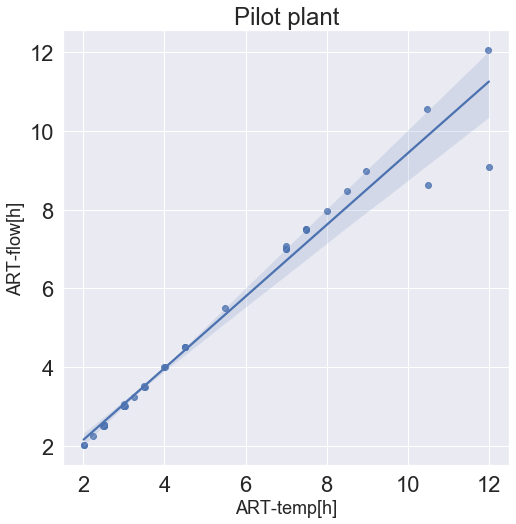

In [121]:
y = df_new_de.loc['2019-11-21':'2019-11-23']['ART_flow'] #target
x1 = df_new_de.loc['2019-11-21':'2019-11-23']['ART_temp'] # feature


plt.figure(figsize=(8,8))
sns.regplot(x = 'ART_temp', y = 'ART_flow',data = df_new_de.loc['2019-11-21':'2019-11-23'])

plt.title('Pilot plant')
plt.xlabel('ART-temp[h]',fontsize=18)
plt.ylabel('ART-flow[h]',fontsize=18)
sns.set(font_scale = 2)

x = sm.add_constant(x1)
results = sm.OLS(y,x).fit()
results.summary()


**Arrival ART**

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               ART_flow   R-squared:                       0.909
Model:                            OLS   Adj. R-squared:                  0.909
Method:                 Least Squares   F-statistic:                     2878.
Date:                Wed, 25 Nov 2020   Prob (F-statistic):          5.94e-152
Time:                        09:52:37   Log-Likelihood:                -315.90
No. Observations:                 290   AIC:                             635.8
Df Residuals:                     288   BIC:                             643.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.3716      0.090      4.112      0.000       0.194       0.550
ART_temp       0.9238      0.017     53.646      0.000       0.890       0.958
==============================================================================
Omnibus:                      142.585   Durbin-Watson:                   1.170
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             8972.994
Skew:                           1.110   Prob(JB):                         0.00
Kurtosis:                      30.160   Cond. No.                         11.5
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

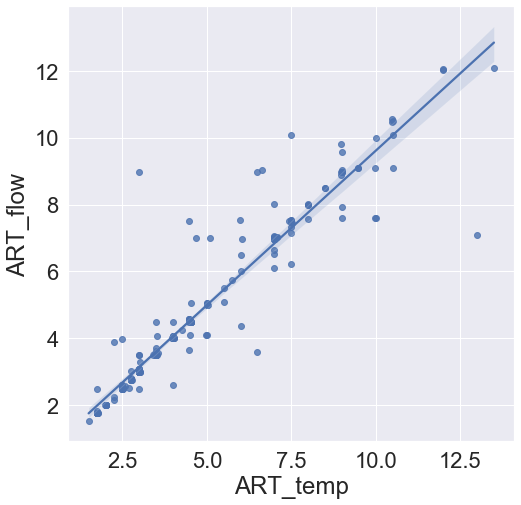

In [122]:
y = df_new_ar['ART_flow'] #target
x1 = df_new_ar['ART_temp'] # feature

plt.figure(figsize=(8,8))
sns.regplot(x = 'ART_temp',
           y = 'ART_flow',
           data = df_new_ar);

x = sm.add_constant(x1)
results = sm.OLS(y,x).fit()
results.summary()

In [123]:
d1 = df_ART_flow_ar.resample(rule='10min', closed='left', label='left', base=0).mean().dropna()
d2 = df_ART_temp_ar.resample(rule='10min', closed='left', label='left', base=0).mean().dropna()

art_df_new = pd.concat([d1,d2], axis = 1).dropna()
art_df_new = art_df_new[art_df_new['ART_flow'] <=25]
#avg_h2s_art_df_new['H2S_aq'] = avg_h2s_art_df_new['H2S_aq'].shift(-1)


## only plot daytime
#avg_h2s_art_df_new = avg_h2s_art_df_new[(avg_h2s_art_df_new.index.hour <=6) & 
                                       #(avg_h2s_art_df_new.index.hour >= 0)]

import statsmodels.api as sm
##### Finction to find best day
r2 = []
days = []
i = 0
for dates in art_df_new.index:
    
    if dates.date() != i:
        i = dates.date()
        
        y = art_df_new[(art_df_new.index.date == dates.date())]['ART_flow'] 
        x1 = art_df_new[(art_df_new.index.date == dates.date())]['ART_temp']

        if len(y) == len(x1):

            x = sm.add_constant(x1)
            results = sm.OLS(y,x).fit()

            if results.rsquared >= 0.0:# and results.conf_int()[1][1] > 0:
                r2.append((results.rsquared))
                days.append(dates.date())

df_r2 = pd.DataFrame(data = {'Day':days,'R²': r2})

In [124]:
df_r2.describe()

,R²
count,28.000000
mean,0.921258
std,0.139092
min,0.557184
25%,0.943009
50%,0.988603
75%,0.999878
max,1.000000


In [125]:
avg_arrival_art_new

,ART_flow,ART_temp
00:00,2.487143,2.464286
01:00,3.084783,3.056087
02:00,3.023182,3.002727
03:00,3.048261,3.076957
04:00,2.275455,2.401364
05:00,2.500000,2.500000
06:00,2.955385,3.004615
07:00,3.548421,3.554737
08:00,4.309048,4.262857
09:00,2.000000,2.000000


In [126]:
#24h arrival profile
y = avg_arrival_art_new['ART_flow'] #target
x1 = avg_arrival_art_new['ART_temp'] # feature

x = sm.add_constant(x1)
results = sm.OLS(y,x).fit()
results.summary()

C:\Users\moham\anaconda3\lib\site-packages\scipy\stats\stats.py:1535: UserWarning:

kurtosistest only valid for n>=20 ... continuing anyway, n=19



<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               ART_flow   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     2628.
Date:                Wed, 25 Nov 2020   Prob (F-statistic):           4.47e-20
Time:                        09:52:39   Log-Likelihood:                 6.0149
No. Observations:                  19   AIC:                            -8.030
Df Residuals:                      17   BIC:                            -6.141
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0642      0.098     -0.658      0.520      -0.270       0.142
ART_temp       1.0212      0.020     51.262      0.000       0.979       1.063
==============================================================================
Omnibus:                       24.116   Durbin-Watson:                   2.508
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               38.160
Skew:                           2.017   Prob(JB):                     5.17e-09
Kurtosis:                       8.651   Cond. No.                         11.6
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""